In [1]:
# Preamble
from astropy.table import Table, column
import numpy as np
import os

%matplotlib inline
import matplotlib as mpl
from matplotlib import pyplot as plt
# better-looking plots
plt.rcParams['font.family'] = 'serif'
plt.rcParams['figure.figsize'] = (10.0, 8)
plt.rcParams['font.size'] = 18
mpl.ticker.AutoLocator.default_params['nbins'] = 5
mpl.ticker.AutoLocator.default_params['prune'] = 'both'

mpl.rcParams['ps.useafm'] = True
mpl.rcParams['pdf.use14corefonts'] = True
mpl.rcParams['text.usetex'] = True

import sys
sys.path.append('../../astro_codes/')

In [46]:
import matplotlib.image as mpimg
import matplotlib.patheffects as path_effects

class ArcImage():
    
    def __init__(self,dr8id,ssh,scp,ftp,band='r',save_directory='save_images'):
        self.dr8id = int(dr8id)
        self.band = band
        self.id_string = str(dr8id)
        self.id_suffix = self.id_string[-3:]
        self.remote_directory = ('/home/zoo/SpArcFiRe/SpArcFiRe/'
                                 '{}/{}/{}'.format(self.band,self.id_suffix,self.id_string))
        self.band_directory = '{}/{}'.format(save_directory,self.band)
        self.galaxy_directory = '{}/{}/{}'.format(save_directory,self.band,self.id_string)
        if os.path.isdir(save_directory) is False:
            os.mkdir(save_directory)
        if os.path.isdir(self.band_directory) is False:
            os.mkdir(self.band_directory)
        if os.path.isdir(self.galaxy_directory) is False:
            os.mkdir(self.galaxy_directory)
        self.ssh = ssh
        self.scp = scp
        self.ftp = ftp
    
    def download_remote_files(self,overwrite=False):
        file_list = self.ftp.listdir(self.remote_directory)
        for file in file_list:
            remote_file = '{}/{}'.format(self.remote_directory,file)
            local_file = '{}/{}'.format(self.galaxy_directory,file)
            if (os.path.exists(local_file)) is True:
                    os.remove(local_file) if overwrite is True else None
            if (os.path.exists(local_file)) is False:
                self.scp.get(remote_file,local_file)
        return None
    
    def download_remote_figure(self,overwrite=False,suffix='B_autoCrop'):
        file = '{}-{}.png'.format(self.id_string,suffix)
        remote_file = '{}/{}'.format(self.remote_directory,file)
        local_file = '{}/{}'.format(self.galaxy_directory,file)
        if (os.path.exists(local_file)) is True:
                os.remove(local_file) if overwrite is True else None
        if (os.path.exists(local_file)) is False:
                self.scp.get(remote_file,local_file)
        return None
    
    def arc_parameters(self,arc_file,N_max=8):
        row_mask = arc_file['gxyName'] == self.dr8id
        arcs = arc_file[row_mask].sort_values('alenRank')
        arc_table = Table(arcs.as_matrix(),names=arcs.dtypes.index)
        if len(arc_table) > N_max:
            arc_table = arc_table[:N_max]
        return arc_table
    
    def galaxy_parameters(self,galaxy_file):
        row_mask = galaxy_file['name'] == self.dr8id
        galaxy_table = galaxy_file[row_mask]
        return galaxy_table
    
    def display_image(self,ax,suffix='B_autoCrop'):
        _ = self.download_remote_figure(overwrite=False,suffix=suffix)
        image_file = '{}/{}-{}.png'.format(self.galaxy_directory,self.id_string,suffix)
        image = mpimg.imread(image_file)
        h, w = image.shape
        ax.imshow(image,cmap='gray')
        ax.set_xlim(0,w-1)
        ax.set_ylim(h-1,0)
        ax.set_xticks([])
        ax.set_yticks([])
        return h, w
     
    def draw_arcs(self,ax,arc_file,label=True,N_max=8,
                  **kwargs):
        plt.sca(ax)
        colors = ('red','blue','orange','magenta',
                  'limegreen','orangered','purple','cyan')
        arc_table = self.arc_parameters(arc_file,N_max=N_max)
        N_arcs = len(arc_table)
        for n in range(N_arcs):
            arc_row = arc_table[n]
            theta_start = arc_row['math_initial_theta']
            theta_end = theta_start + arc_row['relative_theta_end']
            psi = arc_row['pitch_angle']*(2*math.pi/360)
            initial_radius = arc_row['math_initial_radius']
            r0 = initial_radius/np.exp(-psi*theta_start)
            thetas = np.linspace(theta_start,theta_end,1000)
            x = r0*(np.cos(thetas))*np.exp(-psi*thetas)#+128
            y = r0*(np.sin(thetas))*np.exp(-psi*thetas)#+128
            x_transformed = x + 128
            y_transformed = -y + 128
            ax.plot(x_transformed,y_transformed,
                     color=colors[n],**kwargs)
            if label is True:
                x_centre, y_centre = x_transformed[500], y_transformed[500]
                #x_centre = x_centre+5 if x_centre < 128 else x_centre-5
                y_centre = y_centre+8 if y_centre < 20 else y_centre-8
                text = plt.text(x_centre,y_centre,'{}'.format(n+1),
                                color=colors[n])
                text.set_weight('heavy')
                text.set_size(30)
                text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                                       path_effects.Normal()])
            
        return None
    
    def draw_ellipse(self,ax,galaxy_file,h,w,**kwargs):
        galaxy_parameters = self.galaxy_parameters(galaxy_file)
        a = galaxy_parameters['diskMajAxsLen']/2
        b = galaxy_parameters['diskMinAxsLen']/2
        theta_major = galaxy_parameters['diskMajAxsAngleRadians']
        thetas = np.linspace(0,2*math.pi,1000)
        r = (a*b)/np.sqrt((b*np.cos(thetas-theta_major))**2+(a*np.sin(thetas-theta_major))**2)
        x = r*np.cos(thetas)
        y = r*np.sin(thetas)
        ax.plot(x+w/2,-y+h/2,**kwargs)
        return None

In [3]:
sparcfire_samples = Table.read('../../fits/sparcfire/sparcfire_samples.fits')

spiral_sample = np.all([sparcfire_samples[c] for c in ['in_sparcfire','in_mass_limit',
                                                       'in_spiral','axial_ok']],
                       axis=0)

In [6]:
# Load galaxy data
sparcfire_g = Table.read('../../sparcfire_directories/g/g.galaxy_matched.fits')
sparcfire_r = Table.read('../../sparcfire_directories/r/r.galaxy_matched.fits')

In [7]:
# Load arc data
import pandas as pd
sparcfire_g_arcs = pd.read_csv('../../sparcfire_directories/g/g.galaxy_arcs.csv')
sparcfire_r_arcs = pd.read_csv('../../sparcfire_directories/r/r.galaxy_arcs.csv')

In [27]:
g_ok = sparcfire_g['fit_state'] == 'OK'
r_ok = sparcfire_r['fit_state'] == 'OK'

spiral_ok = np.all([sparcfire_samples[c] for c in ['in_mass_limit','axial_ok','in_spiral']],
                   axis=0)

spiral_sample = spiral_ok*g_ok*r_ok
print('{} galaxies Ok in the g+r bands'.format(all_ok.sum()))

gz2_indices = np.arange(len(sparcfire_g))
np.random.seed(0)
N = 100
subset_N = np.random.choice(gz2_indices[spiral_sample],N)
subset_ids = sparcfire_g['dr8objid'][subset_N]

3059 galaxies Ok in the g+r bands


In [34]:
from paramiko import SSHClient
from scp import SCPClient

ssh = SSHClient()
ssh.load_system_host_keys()
ssh.connect('bayonet-08.ics.uci.edu',username='zoo',password='GalaxyZoo2')
scp = SCPClient(ssh.get_transport())
ftp = ssh.open_sftp()

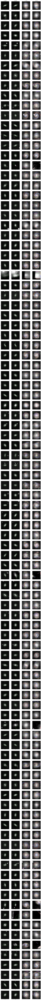

In [59]:
arc_files = (sparcfire_r_arcs, sparcfire_g_arcs)

fig_width = 15
n = 100
fig, axarr = plt.subplots(n,4,figsize=(fig_width,n*fig_width/4))

titles = ['$r$ input','$g$ input','$r$ arcs','$g$ arcs']
for a, ax in enumerate(axarr[0]):
    ax.set_title(titles[a])

for i, id_ in enumerate(subset_ids[:n]):
    axarr_i = axarr[i]
    for b, band in enumerate(['r','g']):
        arc_image = ArcImage(id_,ssh,scp,ftp,band=band)
        ax = axarr_i[b]
        h, w = arc_image.display_image(ax,suffix='A_input')
        if b == 0:
            h_, w_ = h, w
        arc_image.draw_ellipse(ax,sparcfire_r,h_,w_,
                               color='limegreen')
        ax.set_xlabel(w,fontsize=10)
        ax.set_ylabel(h,fontsize=10)
        ax = axarr_i[b+2]
        h, w = arc_image.display_image(ax,suffix='B_autoCrop')
        arc_image.draw_arcs(ax,arc_files[b],label=False,N_max=6)